In [112]:
import plotly.express as px
import pandas as pd
import numpy as np
from scipy import stats
import statsmodels.api as sm


In [113]:
df=pd.read_csv("../data/processed_data/train.csv")

/var/folders/1r/ndm52t3d58j7bkp7_dx_ygc00000gn/T/ipykernel_5244/3612817044.py:1: DtypeWarning:

Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.



In [114]:
df.head(10)

,airport_group,hour,target_actual,target_sched,flights_cnt,avg_duration,max_duration,avg_delay,max_delay,passenger_share,...,dow,holiday,month,hournum,weekend,date,daily_flights_cnt,flights_cnt_prev,flights_cnt_next,weather
0,C,2018-01-01 07:00:00,0,1,2,27.500000,35.0,-7.000000,-2.0,1.0,...,0,True,1,7,0,2018-01-01,27,0,3,NaN
1,C,2018-01-01 08:00:00,1,1,3,40.000000,80.0,-4.333333,-2.0,1.0,...,0,True,1,8,0,2018-01-01,27,2,2,NaN
2,G,2018-01-01 09:00:00,0,0,1,67.000000,67.0,-9.000000,-9.0,1.0,...,0,True,1,9,0,2018-01-01,32,0,3,NaN
3,D,2018-01-01 09:00:00,0,0,2,42.500000,50.0,-3.000000,-1.0,1.0,...,0,True,1,9,0,2018-01-01,31,0,3,NaN
4,C,2018-01-01 09:00:00,1,1,2,27.500000,30.0,-8.500000,-6.0,1.0,...,0,True,1,9,0,2018-01-01,27,3,1,NaN
5,E,2018-01-01 10:00:00,1,1,4,53.750000,135.0,-5.000000,-2.0,1.0,...,0,True,1,10,0,2018-01-01,33,0,3,NaN
6,G,2018-01-01 10:00:00,0,0,3,50.666667,67.0,-9.000000,-5.0,1.0,...,0,True,1,10,0,2018-01-01,32,1,2,NaN
7,D,2018-01-01 10:00:00,1,1,3,65.000000,115.0,1.666667,6.0,1.0,...,0,True,1,10,0,2018-01-01,31,2,1,NaN
8,C,2018-01-01 10:00:00,0,0,1,30.000000,30.0,-11.000000,-11.0,1.0,...,0,True,1,10,0,2018-01-01,27,2,3,NaN
9,F,2018-01-01 11:00:00,1,1,5,23.600000,25.0,7.400000,29.0,1.0,...,0,True,1,11,0,2018-01-01,20,0,3,NaN


In [115]:
fig = px.histogram(df, x="month",y='target_actual', color='airport_group')
fig.show()

In [116]:
fig = px.histogram(df, x="dow",y='target_actual', color='airport_group')
fig.show()

In [117]:
fig = px.histogram(df, x="hournum",y='target_actual', color='airport_group')
fig.show()

In [118]:
fig = px.histogram(df, x="avg_duration",y='target_actual', color='airport_group')
fig.show()

In [119]:
cm = (
    df.groupby(["target_sched", "target_actual"])
      .size()
      .reset_index(name="count")
)

fig = px.density_heatmap(
    cm, x="target_sched", y="target_actual", z="count", 
    text_auto=True, color_continuous_scale="Blues"
)
fig.update_layout(
    xaxis_title="Scheduled Target",
    yaxis_title="Actual Target",
    title="Scheduled vs Actual Simultaneity"
)
fig.show()

In [120]:
cm = (
    df.groupby(["target_sched", "target_actual"])
      .size()
      .reset_index(name="count")
)

# Beregn prosentandel av total
cm["percent"] = cm["count"] / cm["count"].sum() * 100

import plotly.express as px

fig = px.density_heatmap(
    cm, x="target_sched", y="target_actual", z="percent", 
    text_auto=".1f", color_continuous_scale="Blues"
)
fig.update_layout(
    xaxis_title="Scheduled Target",
    yaxis_title="Actual Target",
    title="Scheduled vs Actual Simultaneity (%)"
)
fig.show()

In [121]:
def mismatch_type(row):
    if row["target_sched"] == 1 and row["target_actual"] == 0:
        return "False Positive"
    elif row["target_sched"] == 0 and row["target_actual"] == 1:
        return "False Negative"
    else:
        return "Correct"

df["mismatch"] = df.apply(mismatch_type, axis=1)

In [122]:
df_mismatch = df.groupby(["hournum", "mismatch"]).size().reset_index(name="count")
df_total = df.groupby("hournum").size().reset_index(name="total")

df_mismatch = df_mismatch.merge(df_total, on="hournum")
df_mismatch["percent"] = df_mismatch["count"] / df_mismatch["total"] * 100

fig = px.bar(df_mismatch, x="hournum", y="percent", color="mismatch", 
             title="Mismatch-type per time på døgnet",
             labels={"hournum": "Time på dagen", "percent": "Andel (%)"})
fig.show()

In [123]:
df_flight = df.groupby(["flights_cnt", "mismatch"]).size().reset_index(name="count")
df_total_flight = df.groupby("flights_cnt").size().reset_index(name="total")

df_flight = df_flight.merge(df_total_flight, on="flights_cnt")
df_flight["percent"] = df_flight["count"] / df_flight["total"] * 100

px.line(df_flight, x="flights_cnt", y="percent", color="mismatch",
        title="Mismatch-type etter antall flyvninger per time",
        labels={"flights_cnt": "Antall fly per time", "percent": "Andel (%)"})

False negative -> Sched = 0, Actual = 1
False positive -> Sched = 1, Actual = 0

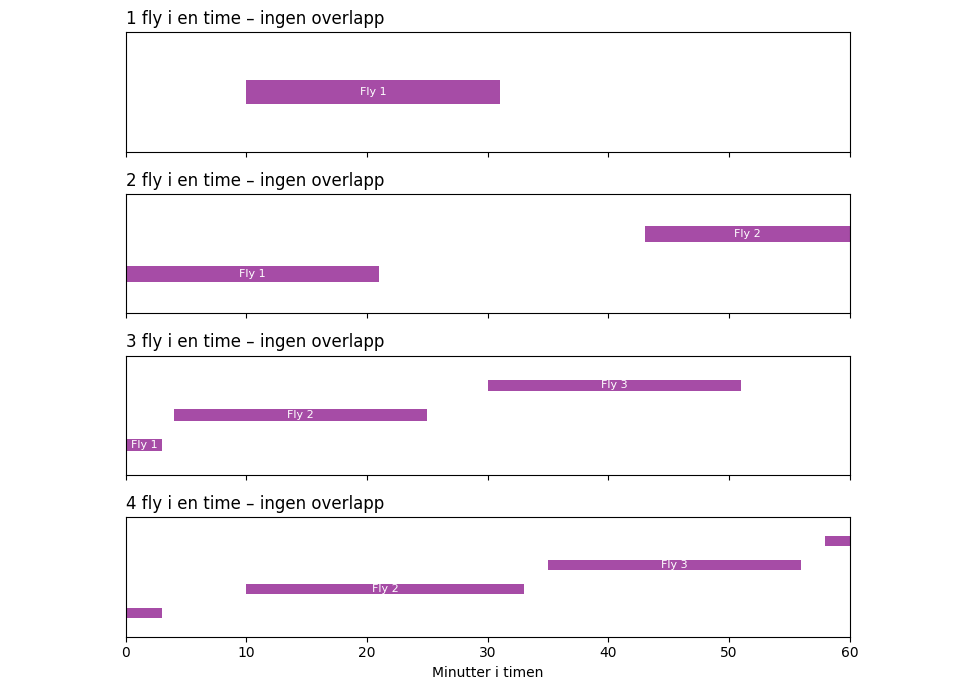

In [124]:
import matplotlib.pyplot as plt

def plot_no_overlap_examples():
    # Hvert intervall ~20 min langt
    examples = {
        1: [(10, 31)],  # Ett fly
        2: [(0, 21), (43, 60)],  # To fly, ingen overlapp
        3: [(0, 3), (4, 25), (30, 51)],  # Tre fly, tettpakket men ingen overlapp
        4: [(-20, 3), (10, 33), (35, 56), (58, 79)],  # Fire fly, akkurat uten overlapp
    }

    fig, axes = plt.subplots(len(examples), 1, figsize=(10, 7), sharex=True)

    for i, (n, intervals) in enumerate(examples.items(), start=1):
        ax = axes[i-1]
        for j, (s, e) in enumerate(intervals, start=1):
            ax.barh(y=j, width=e-s, left=s, height=0.4, color="purple", alpha=0.7)
            ax.text((s+e)/2, j, f"Fly {j}", va="center", ha="center", color="white", fontsize=8)
        
        ax.set_xlim(0, 60)
        ax.set_ylim(0, n+1)
        ax.set_yticks([])
        ax.set_title(f"{n} fly i en time – ingen overlapp", loc="left")

    plt.xlabel("Minutter i timen")
    plt.tight_layout()
    plt.show()

plot_no_overlap_examples()


In [125]:
px.histogram(
    df,
    x="avg_delay", 
    color="mismatch", 
    nbins=500,
    title="Delay fordelt på mismatch (–100 til 100 min)"
)

In [126]:
df_wrong = df[df["avg_delay"].abs() > 500]
df_wrong

,airport_group,hour,target_actual,target_sched,flights_cnt,avg_duration,max_duration,avg_delay,max_delay,passenger_share,...,holiday,month,hournum,weekend,date,daily_flights_cnt,flights_cnt_prev,flights_cnt_next,weather,mismatch
11341,B,2018-05-12 03:00:00,0,0,1,50.0,50.0,534.0,534.0,1.0,...,False,5,3,1,2018-05-12,17,1,3,NaN,Correct
61584,B,2019-12-08 12:00:00,0,0,2,210.0,355.0,529.5,1054.0,0.5,...,False,12,12,1,2019-12-08,44,5,2,NaN,Correct
61589,B,2019-12-08 13:00:00,0,1,2,202.5,355.0,519.5,1054.0,0.0,...,False,12,13,1,2019-12-08,44,2,4,NaN,False Positive
80080,B,2020-08-27 11:00:00,0,0,1,180.0,180.0,771.0,771.0,0.0,...,False,8,11,0,2020-08-27,39,2,2,NaN,Correct
80084,B,2020-08-27 12:00:00,0,0,2,167.5,180.0,776.5,782.0,0.0,...,False,8,12,0,2020-08-27,39,1,4,NaN,Correct
120512,A,2022-01-25 07:00:00,0,0,1,50.0,50.0,1492.0,1492.0,1.0,...,False,1,7,0,2022-01-25,36,4,7,NaN,Correct
172902,B,2023-10-14 17:00:00,0,0,1,100.0,100.0,730.0,730.0,0.0,...,False,10,17,1,2023-10-14,17,1,2,NaN,Correct
173322,B,2023-10-19 12:00:00,1,0,2,65.0,75.0,537.0,1068.0,0.5,...,False,10,12,0,2023-10-19,55,3,2,NaN,False Negative


DP: K2=270635.10, p=0
JB: JB=776180703.02, p=0


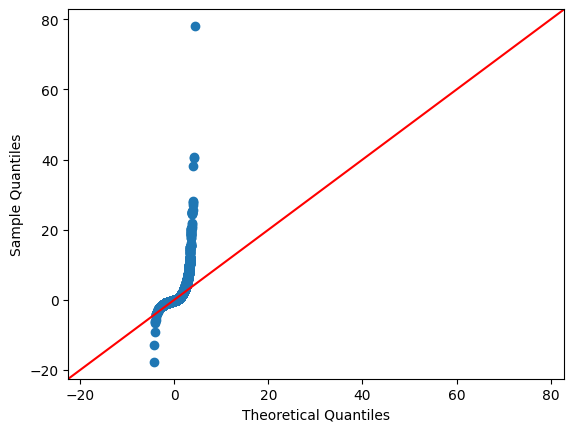

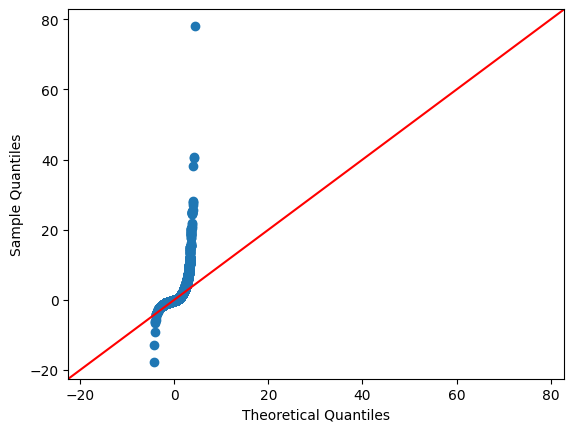

In [127]:
x = df["avg_delay"].dropna().astype(float)

# D’Agostino–Pearson
k2, p_dp = stats.normaltest(x)   # n>=8
print(f"DP: K2={k2:.2f}, p={p_dp:.3g}")



# Jarque–Bera
jb, p_jb = stats.jarque_bera(x)
print(f"JB: JB={jb:.2f}, p={p_jb:.3g}")


# QQ-plot
sm.qqplot((x - x.mean())/x.std(ddof=1), line="45")

In [128]:
px.histogram(df, x="hournum", color="target_actual",
             facet_col="target_sched", barmode="overlay")

In [129]:
px.histogram(df, x="dow", color="target_actual",
             facet_col="target_sched", barmode="overlay")

In [130]:
px.histogram(df, x="avg_duration", color="target_actual",
             facet_col="target_sched", barmode="overlay")

In [131]:
px.histogram(df, x="hour", y="flights_cnt",title="Distribution of Flights Over Time", color="airport_group")

In [132]:
# Beregn andel samtidighet per time
df_grouped = (
    df.groupby("flights_cnt")["target_actual"]
      .mean()  # gjennomsnitt = andel av 1-ere
      .reset_index(name="percent_concurrent")
)

# Gjør om til prosent
df_grouped["percent_concurrent"] *= 100

# Plot
fig = px.bar(
    df_grouped, x="flights_cnt", y="percent_concurrent",
    labels={"hournum": "Hour of Day", "percent_concurrent": "Samtidighet (%)"},
    title="Andel flyvninger med samtidighet per time"
)
fig.show()

In [133]:
df_dow = df.groupby("dow")["target_actual"].mean().reset_index()
df_dow["target_actual"] *= 100  # til prosent

px.bar(df_dow, x="dow", y="target_actual",
       title="Andel samtidighet per ukedag",
       labels={"dow": "Ukedag (0=mandag)", "target_actual": "Samtidighet (%)"})

In [134]:
df_month = df.groupby("month")["target_actual"].mean().reset_index()
df_month["target_actual"] *= 100

px.line(df_month, x="month", y="target_actual",
        title="Andel samtidighet per måned",
        labels={"month": "Måned", "target_actual": "Samtidighet (%)"})

In [135]:
df_group = df.groupby("airport_group")["target_actual"].mean().reset_index()
df_group["target_actual"] *= 100

px.bar(df_group, x="airport_group", y="target_actual",
       title="Andel samtidighet per flyplassgruppe",
       labels={"airport_group": "Flyplassgruppe", "target_actual": "Samtidighet (%)"})

In [136]:
px.histogram(df, x="avg_duration", color="target_actual",
             nbins=50, barmode="overlay",
             title="Fordeling av gjennomsnittlig flytid etter samtidighet",
             labels={"avg_duration": "Gj.snittlig flytid (min)", "target_actual": "Samtidighet"})


In [137]:
import sys
sys.path.append("../src")  # legg til mappen hvor preprocess.py ligger

from preprocessing import (
    load_flights,
    handle_wrong_times,
    make_intervals,
    expand_to_hours,
    hourly_overlap,
    make_hourly_targets,
    make_hourly_features,
    preprocess
)

In [138]:
df = load_flights("../data/raw_data/historical_flights.csv")
df = handle_wrong_times(df)

# Ta en liten sample
sample = df.head(10000)

intervals = make_intervals(sample, actual=True)
expanded = expand_to_hours(intervals)

expanded[["flight_id", "start", "end", "hour"]].head(20)

,flight_id,start,end,hour
0,SK4517,2018-08-10 15:49:00,2018-08-10 16:12:00,2018-08-10 15:00:00
1,SK4517,2018-08-10 15:49:00,2018-08-10 16:12:00,2018-08-10 16:00:00
2,WF180,2023-03-07 05:14:00,2023-03-07 05:37:00,2023-03-07 05:00:00
3,WF8102,2018-01-10 11:55:00,2018-01-10 12:18:00,2018-01-10 11:00:00
4,WF8102,2018-01-10 11:55:00,2018-01-10 12:18:00,2018-01-10 12:00:00
5,WF743,2018-01-03 11:32:00,2018-01-03 11:55:00,2018-01-03 11:00:00
6,SK4519,2018-01-31 08:46:00,2018-01-31 09:09:00,2018-01-31 08:00:00
7,SK4519,2018-01-31 08:46:00,2018-01-31 09:09:00,2018-01-31 09:00:00
8,SK4525,2018-01-02 16:01:00,2018-01-02 16:24:00,2018-01-02 16:00:00
9,DY423,2018-01-01 11:26:00,2018-01-01 11:49:00,2018-01-01 11:00:00
